# Automatic Number Plate Recognition (ANPR)

This project focuses on real-time Automatic Number Plate Recognition (ANPR) using OpenCV and deep learning. It involves detecting vehicle license plates using a YOLO-based model and extracting text from the plates using Optical Character Recognition (OCR). Utilizing the `andrewmvd/car-plate-detection` dataset from Kaggle.  

### Key Steps:
- **Dataset Preparation**: Load and preprocess images for training.
- **License Plate Detection**: Use YOLO for accurate number plate localization.
- **OCR Extraction**: Extract text from detected plates using Easy OCR.

The goal is to build a robust and efficient ANPR system for vehicle identification. 🚗💡


In [3]:
# Installing required libraries 
!pip install torch torchvision
!pip install easyocr
!pip install ultralytics
!pip install easyocr

In [4]:
# Importing all required libraries and modules
import cv2
import os
import glob 
import torch
import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet 
import matplotlib.patches as patches
from PIL import Image
from pathlib import Path
from ultralytics import YOLO
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

In [5]:
#download data set 
path = kagglehub.dataset_download("andrewmvd/car-plate-detection")

xml_files_path = glob.glob(f'{path}/annotations/*.xml') #glob for retrieving file paths 
image_files_path = glob.glob(f'{path}/images/**/*.png')

# Initialize labels_dict to store image data and bounding box coordinates
labels_dict = {'filepath': [], 'xmin': [], 'xmax': [], 'ymin': [], 'ymax': []}

# Annoted labels of images are stored in xml file so parsing it
for xml_filename in xml_files_path:
    info = xet.parse(xml_filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')

    # Extract bounding box coordinates from xml
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    # Adjust image filename and store data in labels_dict
    image_filename = xml_filename.replace('annotations', 'images').replace('.xml', '.png')
    labels_dict['filepath'].append(image_filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [6]:
# Find the index of the entry corresponding to the desired image name
# Testing on single image

image_name = "Cars1.png"
index = -1
for i, filepath in enumerate(labels_dict['filepath']):
    if(image_name in filepath):
        index = i
        break
        
selected_entry = {
        'filepath': labels_dict['filepath'][index],
        'xmin': labels_dict['xmin'][index],
        'xmax': labels_dict['xmax'][index],
        'ymin': labels_dict['ymin'][index],
        'ymax': labels_dict['ymax'][index],
    }
selected_entry

{'filepath': '/kaggle/input/car-plate-detection/images/Cars1.png',
 'xmin': 134,
 'xmax': 262,
 'ymin': 128,
 'ymax': 160}

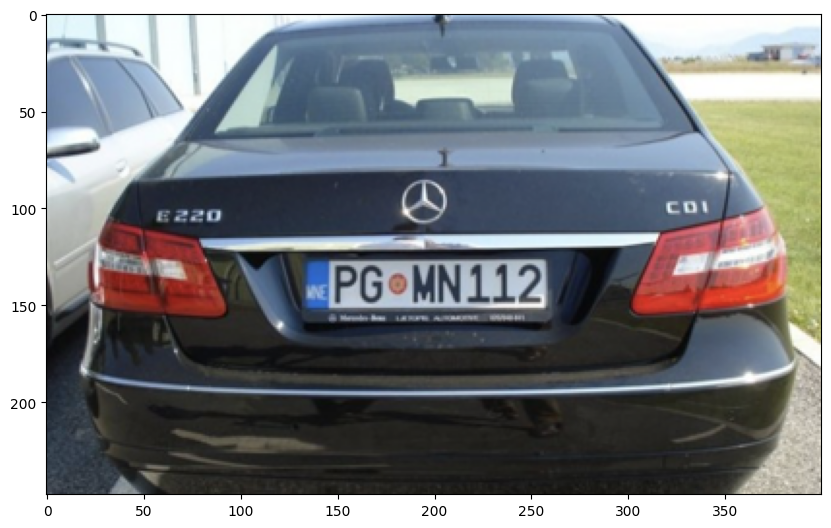

In [7]:
# Load the image
image_path = selected_entry['filepath']
image = Image.open(image_path)

# Create a plot to display the image
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
plt.show()

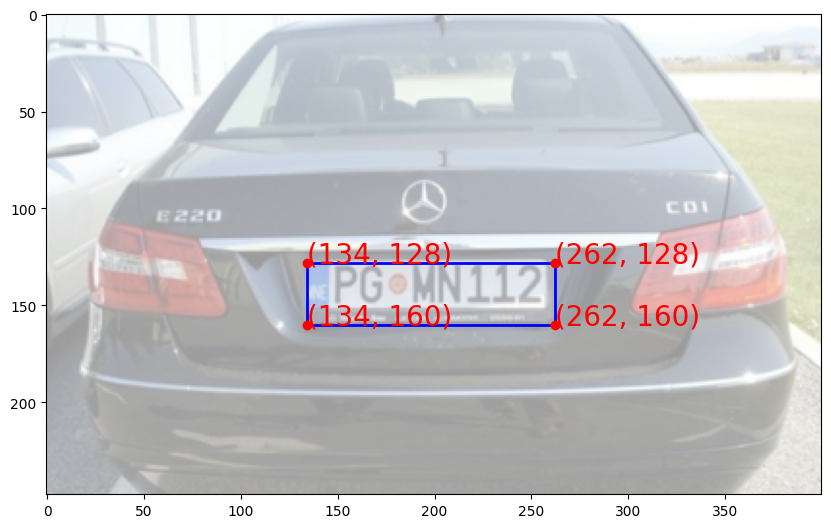

In [8]:
xmin = selected_entry['xmin']
xmax = selected_entry['xmax']
ymin = selected_entry['ymin']
ymax = selected_entry['ymax']

img = Image.open(selected_entry['filepath'])
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(img,alpha=0.4)

points = [(xmin, ymin), (xmax, ymin), (xmax, ymax), (xmin, ymax)]
for (px, py) in points:
    ax.plot(px, py, color='red', marker='o', linestyle='')  # red circles

    # Annotate with the coordinates in red text
    ax.text(px, py, f'({px}, {py})', color='red', fontsize=20, ha='left')

# Create a Rectangle patch for the bounding box 
rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='blue', facecolor='none')
ax.add_patch(rect)

plt.show()


In [9]:
# splting train and test 
image_paths = labels_dict['filepath']
labels = list(zip(labels_dict['xmin'], labels_dict['xmax'],
                  labels_dict['ymin'], labels_dict['ymax']))

train_image_paths, test_image_paths, train_labels, test_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42)

In [10]:
output_dir = 'yolo_dataset'
os.makedirs(f'{output_dir}/images/train', exist_ok=True)
os.makedirs(f'{output_dir}/images/val', exist_ok=True)
os.makedirs(f'{output_dir}/labels/train', exist_ok=True)
os.makedirs(f'{output_dir}/labels/val', exist_ok=True)



# Function to convert bounding boxes to YOLO format
def convert_bbox_to_yolo_format(bbox, image_width, image_height):
    xmin, xmax, ymin, ymax = bbox
    x_center = (xmin + xmax) / 2 / image_width
    y_center = (ymin + ymax) / 2 / image_height
    width = (xmax - xmin) / image_width
    height = (ymax - ymin) / image_height
    return x_center, y_center, width, height

# Process training data
for i, (image_path, bbox) in enumerate(zip(train_image_paths, train_labels)):
    img = cv2.imread(image_path)
    h, w, _ = img.shape

    # Convert bounding box
    x_center, y_center, width, height = convert_bbox_to_yolo_format(bbox, w, h)
    label_path = Path(image_path).stem + '.txt'

    # Save image and label
    cv2.imwrite(f'{output_dir}/images/train/{Path(image_path).name}', img)
    
    with open(f'{output_dir}/labels/train/{label_path}', 'w') as f:
        f.write(f'0 {x_center} {y_center} {width} {height}\n')


# processing test data
for i, (image_path, bbox) in enumerate(zip(test_image_paths, test_labels)):
    img = cv2.imread(image_path)
    h, w, _ = img.shape

    # Convert bounding box
    x_center, y_center, width, height = convert_bbox_to_yolo_format(bbox, w, h)
    label_path = Path(image_path).stem + '.txt'

    # Save image and label
    cv2.imwrite(f'{output_dir}/images/val/{Path(image_path).name}', img)
    with open(f'{output_dir}/labels/val/{label_path}', 'w') as f:
        f.write(f'0 {x_center} {y_center} {width} {height}\n')

In [11]:

train_images_path = '/kaggle/working/yolo_dataset/images/train'  
val_images_path = '/kaggle/working/yolo_dataset/images/val'     
classes = ['license_plate']  # List of class names

# Content for the YAML file
yaml_content = f"""
train: {train_images_path}
val: {val_images_path}

nc: {len(classes)}
names: {classes}
"""

# Save the YAML file
yaml_file_path = 'license_plate.yaml'
with open(yaml_file_path, 'w') as yaml_file:
    yaml_file.write(yaml_content)

In [12]:
model = YOLO("yolo11n.pt")


100%|██████████| 5.35M/5.35M [00:00<00:00, 76.1MB/s]


In [13]:
model.train(
    data='license_plate.yaml',  # Path to the YAML config file
    epochs=50,                  # Number of training epochs
    batch=16,                   # Batch size
    imgsz=640,                  # Image size for training
    workers=4                   # Number of workers for data loading
)

Ultralytics 8.3.81 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=license_plate.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

100%|██████████| 755k/755k [00:00<00:00, 17.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/yolo_dataset/labels/train... 346 images, 0 backgrounds, 0 corrupt: 100%|██████████| 346/346 [00:00<00:00, 531.25it/s]

train: New cache created: /kaggle/working/yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/yolo_dataset/labels/val... 87 images, 0 backgrounds, 0 corrupt: 100%|██████████| 87/87 [00:00<00:00, 489.85it/s]

val: New cache created: /kaggle/working/yolo_dataset/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.24G      1.444      3.388       1.32         24        640: 100%|██████████| 22/22 [00:05<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]


                   all         87         87    0.00326      0.977       0.63      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.22G      1.494      2.324      1.278         21        640: 100%|██████████| 22/22 [00:03<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         87         87      0.585      0.138      0.372      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.22G      1.518      2.068      1.265         27        640: 100%|██████████| 22/22 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.28it/s]

                   all         87         87      0.479      0.299      0.263      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.22G      1.515      1.996      1.297         16        640: 100%|██████████| 22/22 [00:03<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.08it/s]

                   all         87         87      0.425       0.31      0.341      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.22G      1.645      2.012      1.348         18        640: 100%|██████████| 22/22 [00:03<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.39it/s]

                   all         87         87      0.564       0.52       0.51      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.23G      1.559      1.794       1.31         18        640: 100%|██████████| 22/22 [00:03<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.54it/s]

                   all         87         87      0.779      0.644      0.707      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.23G      1.525      1.629      1.303         12        640: 100%|██████████| 22/22 [00:03<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.18it/s]

                   all         87         87      0.833      0.609      0.698      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.22G      1.535       1.54      1.273         28        640: 100%|██████████| 22/22 [00:03<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.92it/s]

                   all         87         87      0.323      0.414      0.352       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.22G      1.465       1.47      1.286         18        640: 100%|██████████| 22/22 [00:03<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.03it/s]

                   all         87         87      0.705      0.631      0.663      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.22G      1.538      1.434      1.343         19        640: 100%|██████████| 22/22 [00:03<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         87         87      0.771      0.776      0.778      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.22G      1.455      1.313      1.241         21        640: 100%|██████████| 22/22 [00:03<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.02it/s]

                   all         87         87      0.809      0.724      0.744      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.23G      1.488      1.312      1.292         15        640: 100%|██████████| 22/22 [00:03<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.65it/s]

                   all         87         87      0.734       0.69      0.742      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.22G       1.41      1.247      1.264         17        640: 100%|██████████| 22/22 [00:03<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         87         87      0.756      0.805      0.791      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.22G      1.444      1.226      1.281         17        640: 100%|██████████| 22/22 [00:03<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         87         87       0.81      0.782      0.814       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.22G       1.42      1.133      1.264         18        640: 100%|██████████| 22/22 [00:03<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.10it/s]

                   all         87         87      0.834      0.747      0.835      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.22G      1.392      1.128      1.257         15        640: 100%|██████████| 22/22 [00:03<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.36it/s]

                   all         87         87      0.816      0.816      0.865      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.22G      1.381      1.052      1.248         21        640: 100%|██████████| 22/22 [00:03<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.13it/s]

                   all         87         87      0.829      0.862      0.868      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.22G       1.37      1.086      1.223         21        640: 100%|██████████| 22/22 [00:03<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.04it/s]

                   all         87         87      0.774      0.816      0.798      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.22G       1.35      1.031      1.221         20        640: 100%|██████████| 22/22 [00:03<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.14it/s]

                   all         87         87      0.784      0.885      0.857      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.22G      1.366      1.056      1.196         16        640: 100%|██████████| 22/22 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.14it/s]

                   all         87         87      0.754      0.862      0.861      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.22G      1.387      1.037      1.246         22        640: 100%|██████████| 22/22 [00:03<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.06it/s]

                   all         87         87      0.722      0.839      0.831      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.22G      1.348      1.031      1.216         14        640: 100%|██████████| 22/22 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.46it/s]

                   all         87         87      0.879      0.828      0.869      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.22G      1.367      1.006      1.207         22        640: 100%|██████████| 22/22 [00:03<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         87         87      0.855      0.828      0.889      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.22G      1.288     0.9565      1.178         18        640: 100%|██████████| 22/22 [00:04<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.49it/s]

                   all         87         87       0.85      0.897      0.877        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.22G      1.336     0.9597      1.187         18        640: 100%|██████████| 22/22 [00:03<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.46it/s]

                   all         87         87      0.861      0.851      0.885      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.22G      1.349     0.9338      1.205         19        640: 100%|██████████| 22/22 [00:03<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.55it/s]

                   all         87         87      0.858      0.832      0.847      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.22G      1.287     0.9003      1.166         20        640: 100%|██████████| 22/22 [00:03<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.57it/s]

                   all         87         87      0.803      0.897      0.872      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.22G      1.346     0.9021       1.21         17        640: 100%|██████████| 22/22 [00:03<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.51it/s]

                   all         87         87      0.862      0.874      0.899      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.23G      1.266     0.8887      1.181         15        640: 100%|██████████| 22/22 [00:03<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.32it/s]

                   all         87         87      0.829      0.908       0.88      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.22G      1.293     0.8885      1.189         21        640: 100%|██████████| 22/22 [00:03<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.41it/s]

                   all         87         87      0.818      0.874       0.87      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.22G      1.306     0.8905      1.198         17        640: 100%|██████████| 22/22 [00:03<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         87         87       0.79      0.907       0.83      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.22G      1.309     0.8763      1.176         16        640: 100%|██████████| 22/22 [00:03<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.28it/s]

                   all         87         87      0.781      0.851      0.861      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.23G       1.28     0.8111       1.17         17        640: 100%|██████████| 22/22 [00:03<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.24it/s]

                   all         87         87      0.785      0.925      0.921      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.22G      1.256     0.7894      1.159         22        640: 100%|██████████| 22/22 [00:03<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         87         87      0.812      0.945      0.902      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.22G      1.244      0.841      1.161         17        640: 100%|██████████| 22/22 [00:03<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.11it/s]

                   all         87         87      0.819      0.936       0.88      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.22G      1.216     0.8177      1.129         20        640: 100%|██████████| 22/22 [00:03<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.46it/s]

                   all         87         87      0.851      0.908      0.882      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.22G      1.268     0.8037      1.139         20        640: 100%|██████████| 22/22 [00:03<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         87         87      0.859      0.907      0.861      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.22G      1.217     0.8079      1.135         23        640: 100%|██████████| 22/22 [00:03<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.27it/s]

                   all         87         87      0.783      0.908      0.855       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.22G      1.154     0.7658      1.096         21        640: 100%|██████████| 22/22 [00:03<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.99it/s]

                   all         87         87      0.853      0.908      0.904      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.22G      1.201     0.7604      1.129         16        640: 100%|██████████| 22/22 [00:03<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.02it/s]

                   all         87         87      0.858      0.904      0.865      0.507


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.22G      1.226     0.7984      1.142         10        640: 100%|██████████| 22/22 [00:04<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.68it/s]

                   all         87         87      0.881      0.851       0.88      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.22G      1.152     0.7362      1.113         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         87         87      0.893      0.867      0.908      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.22G      1.122     0.7187      1.084         10        640: 100%|██████████| 22/22 [00:03<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.56it/s]

                   all         87         87      0.857      0.931      0.908      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.22G      1.157     0.7311       1.09         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.43it/s]

                   all         87         87      0.857      0.908      0.913      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.22G      1.149     0.6915      1.097         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.30it/s]

                   all         87         87      0.844      0.908      0.916      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.22G      1.111     0.6407      1.078         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.30it/s]

                   all         87         87      0.831      0.903      0.878      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.22G      1.097     0.6573       1.08         10        640: 100%|██████████| 22/22 [00:03<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.49it/s]

                   all         87         87      0.841      0.908      0.889       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.22G      1.098     0.6647      1.088          9        640: 100%|██████████| 22/22 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.08it/s]

                   all         87         87      0.843      0.929      0.893      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.22G      1.078      0.631      1.062         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.69it/s]

                   all         87         87      0.856       0.92      0.886      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.22G      1.083     0.6354      1.077         10        640: 100%|██████████| 22/22 [00:03<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.68it/s]

                   all         87         87      0.858      0.905      0.883      0.539



50 epochs completed in 0.071 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.81 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]


                   all         87         87      0.888      0.819      0.922      0.562


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b907c146710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

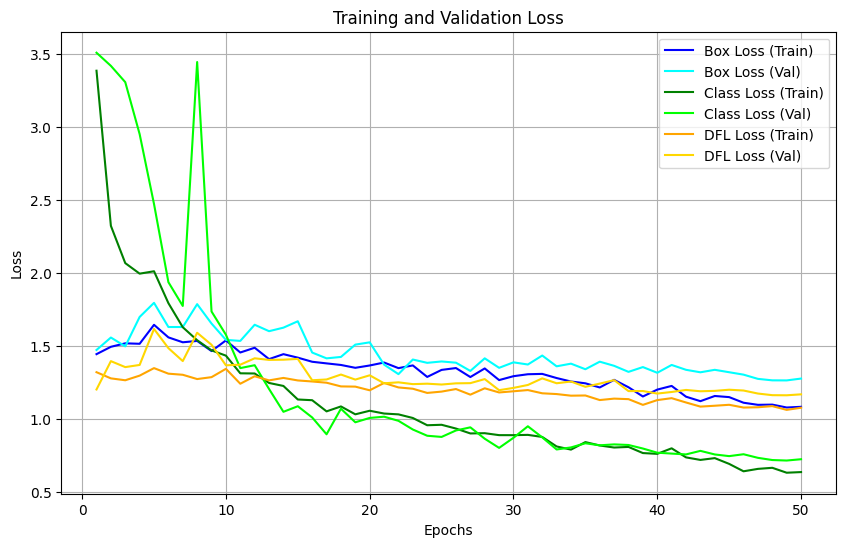

In [14]:
results_path = 'runs/detect/train/results.csv'
data = pd.read_csv(results_path)

# Define paired colors for train and validation
train_colors = ['blue', 'green', 'orange']
val_colors = ['cyan', 'lime', 'gold']

# Plot losses with paired colors
plt.figure(figsize=(10, 6))
plt.plot(data['epoch'], data['train/box_loss'], label='Box Loss (Train)', color=train_colors[0])
plt.plot(data['epoch'], data['val/box_loss'], label='Box Loss (Val)', color=val_colors[0])

plt.plot(data['epoch'], data['train/cls_loss'], label='Class Loss (Train)', color=train_colors[1])
plt.plot(data['epoch'], data['val/cls_loss'], label='Class Loss (Val)', color=val_colors[1])

plt.plot(data['epoch'], data['train/dfl_loss'], label='DFL Loss (Train)', color=train_colors[2])
plt.plot(data['epoch'], data['val/dfl_loss'], label='DFL Loss (Val)', color=val_colors[2])

# Add labels, title, legend, and grid
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid()
plt.show()

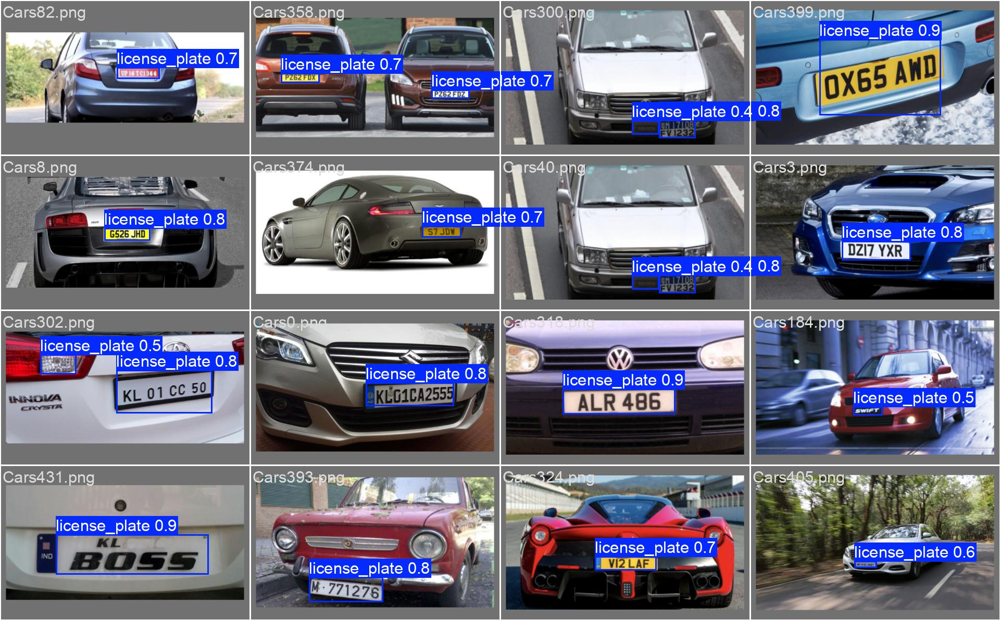

In [15]:
Image.open('/kaggle/working/runs/detect/train/val_batch0_pred.jpg')


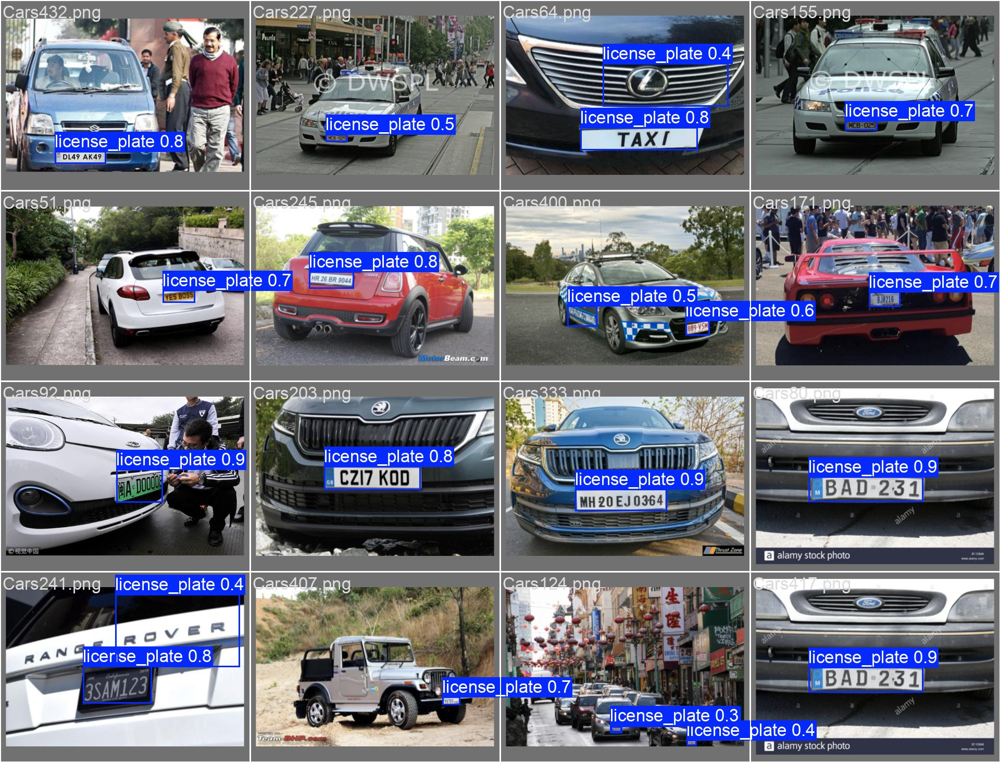

In [16]:
Image.open('/kaggle/working/runs/detect/train/val_batch1_pred.jpg')

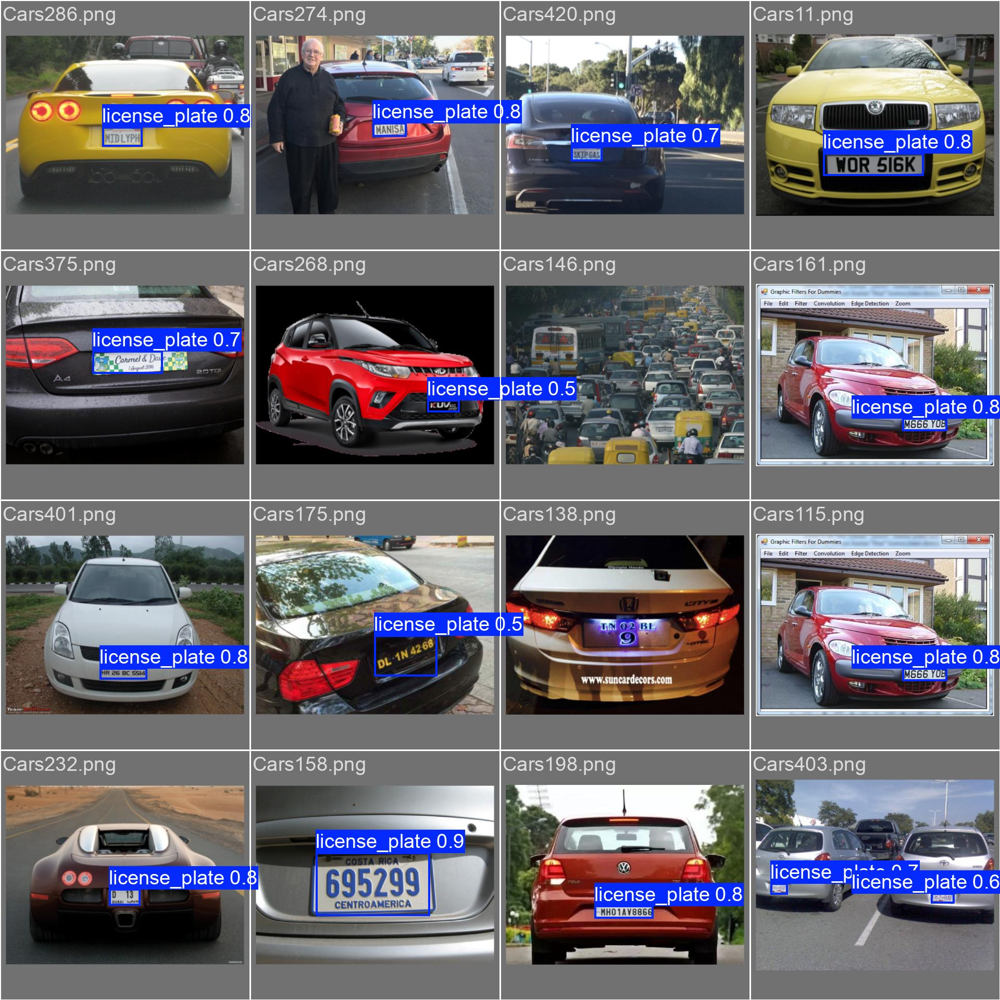

In [17]:
Image.open('/kaggle/working/runs/detect/train/val_batch2_pred.jpg')

In [18]:
!gdown "https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t
To: /kaggle/working/carImage1.png
100%|████████████████████████████████████████| 358k/358k [00:00<00:00, 96.1MB/s]


In [19]:
!gdown "https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t
To: /kaggle/working/carImage2.png
100%|████████████████████████████████████████| 139k/139k [00:00<00:00, 97.0MB/s]


In [20]:
!gdown "https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t
To: /kaggle/working/demo.mp4
100%|██████████████████████████████████████| 9.56M/9.56M [00:00<00:00, 23.9MB/s]


In [21]:
!gdown "https://drive.google.com/uc?export=download&id=1x232YF9hS4tBQ2DOTVA5bjQHsczbLqix"

Downloading...
From: https://drive.google.com/uc?export=download&id=1x232YF9hS4tBQ2DOTVA5bjQHsczbLqix
To: /kaggle/working/car.png
100%|██████████████████████████████████████| 54.5k/54.5k [00:00<00:00, 84.7MB/s]


In [23]:
# Load YOLO model
import easyocr
model = YOLO("runs/detect/train/weights/best.pt")

# Load image
image_path = "car.png"
image = cv2.imread(image_path)

# Perform prediction
results = model.predict(source=image_path, conf=0.25,save=True)

# Initialize OCR models
easyocr_reader = easyocr.Reader(['en'])  # English language model

for result in results:
    for box in result.boxes:
        # Extract bounding box coordinates (x_min, y_min, x_max, y_max)
        x_min, y_min, x_max, y_max = map(int, box.xyxy[0].tolist())

        # Crop the detected license plate from the image
        cropped_plate = image[y_min:y_max, x_min:x_max]

        # Convert to grayscale
        gray_plate = cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2GRAY)

        # Apply thresholding
        processed_plate = cv2.adaptiveThreshold(gray_plate, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                cv2.THRESH_BINARY_INV, 11, 2)

        # EasyOCR prediction
        easyocr_result = easyocr_reader.readtext(processed_plate)
        easyocr_text = " ".join([res[1] for res in easyocr_result])


        # Display extracted text
        print("EasyOCR Detected Number Plate:", easyocr_text.strip())

        # Save processed images for debugging
        cv2.imwrite("cropped_plate.png", cropped_plate)
        cv2.imwrite("processed_plate.png", processed_plate)



image 1/1 /kaggle/working/car.png: 544x640 1 license_plate, 44.0ms
Speed: 2.5ms preprocess, 44.0ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 640)
Results saved to runs/detect/predict
EasyOCR Detected Number Plate: IND 6JO3ERO563


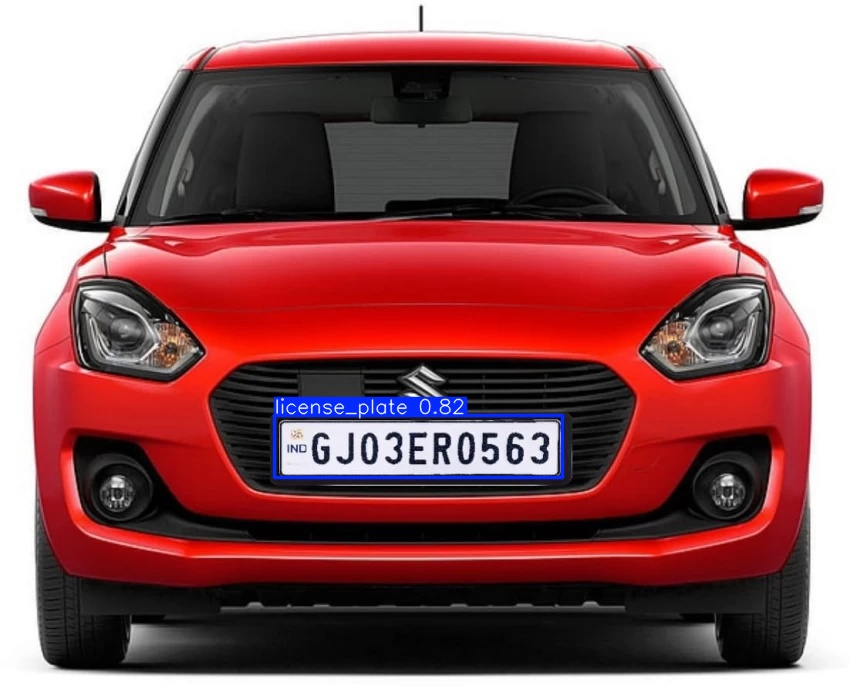

In [25]:
Image.open("/kaggle/working/runs/detect/predict/car.jpg")

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='runs/detect/train/weights/best.pt' source='demo.mp4'

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

# Input and output video paths
input_video = "runs/detect/predict/demo.avi"
output_video = "runs/detect/predict/demo.mp4"

# Convert AVI to MP4 using ffmpeg (overwrite if file exists)
os.system(f"ffmpeg -i {input_video} -vcodec libx264 -crf 23 -preset fast {output_video} -y")

# Read the converted MP4 video
mp4 = open(output_video, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Display the video in Jupyter Notebook
HTML(f'<video width="640" height="360" controls><source src="{data_url}" type="video/mp4"></video>')
